# DSMCER Lecture 2: Distributions and Descriptive statistics

1. What is a distribution
    1. Liklihood of an event
    2. Basic statistics
    3. _Poll_: compare these distributions
    4. Cumulative liklihood
    5. Distributions in Python
2. Distribution zoo
3. Empirical distributions: when you don't know the PDF
    1. I have some data from a distribution
    2. _Exercise_: how does the empirical distribution change with size
4. Population from Sample
    1. _Exercise_: standard error of the mean
    2. Estimating population mean: Central limit theorem
    3. Confidence interval of the mean with t statistic
    4. _Exercise_: Estimate the population mean of HCEPDB data
    

In [1]:
# NEW!
import scipy.stats

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set_style('whitegrid')
sns.set_context('talk')

***
***

## 1. What is a distribution

### A. Liklihood of an event

<font size=5><center>The probability density function PDF represents the __relative probability of observing a particular value of a random variable__ (_per unit length_).

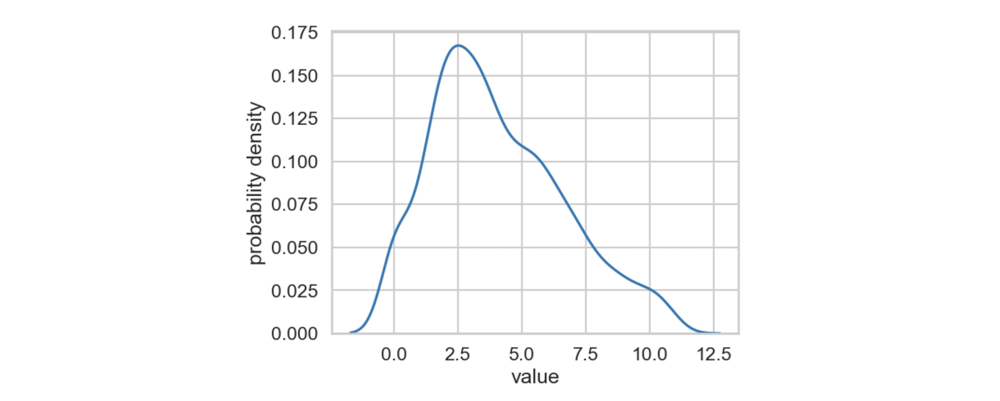

<font size=4><center>Let's say this value is a __measurement__, like "speed of a car m/s" it is a "_random variable_" in the sense that __if I were to randomly pick someone driving on the road, they would have a speed__.

<font size=4><center>The integral of the PDF must equal 1.0, and the integral between two points is the probability of observing taking a measurement and observing its value to be between those points.

<font size=4><center>_What is the probability of taking a measurement and observing the value 10.0?_

><span style='color:red'>remove for lecture</span> Trick question, its 0!

***

<font size=4><center>If you know the whole PDF of a variable, __you have access to all statistical knowledge of that variable__! <span style="color:blue">Unfortunately you rarely have a PDF</span>.

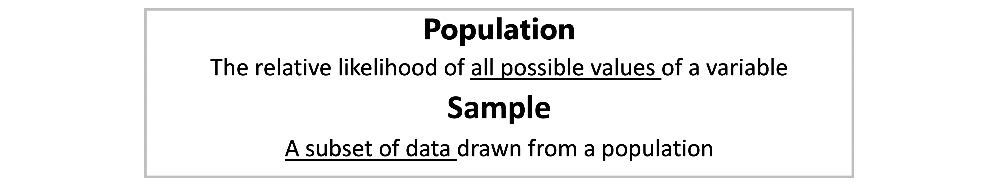

<font size=4><center>__We almost always work with samples__, and our __goal is to use the sample to draw conclusions about the population__. Keep this in your mind and we will return to this concept, and for now explore the population distribution a bit more.

***

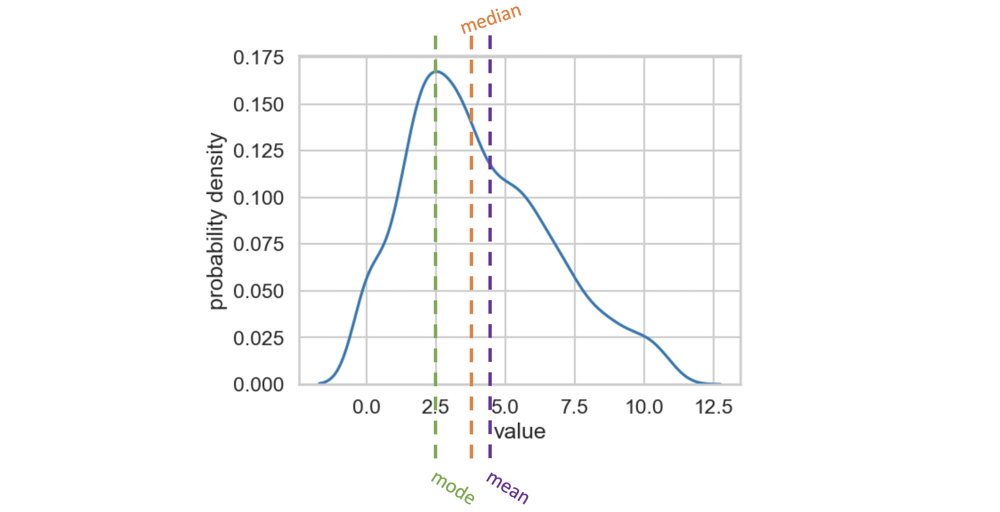

<font size=4><center>__Mode__: most likely value.
<font size=4><center>__Median__: 50% of observations will be greater than me, the other 50% will be lower
<font size=4><center>__Mean__: Over many observations, the sum divided by the number of observations is the mean
    
***

<font size=4><center>How "reliable" is the random variable?

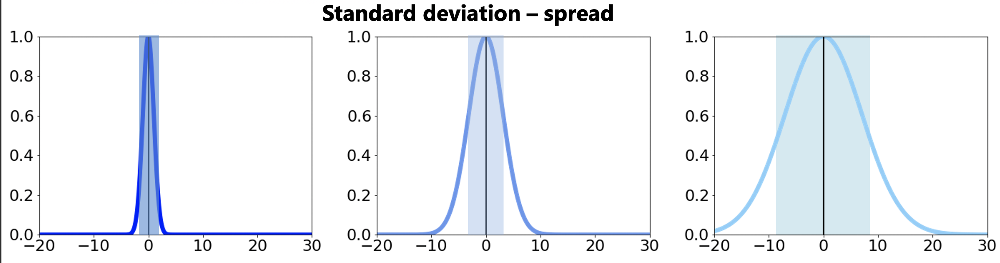

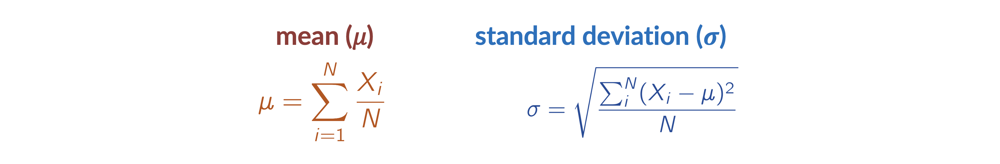

<font size=6><center>Variance
    
<font size=6>$$var=\sigma^2$$

<font size=4><center>_What is N_?
   


><span style='color:red'>remove for lecture</span> For a PDF N is infinity and these equations become integrals.

<font size=4><center><span style="color:blue">Again, unfortunately you rarely have the full PDF</span>

***

### B. Poll: Compare these distributions



<font size=5><center>Choose left or right distribution to draw from for the following goals...

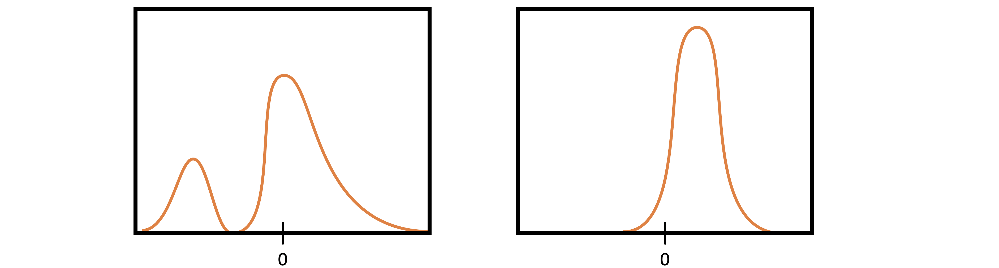

<font size=4>Choose left or right distribution for the following goals...
    
<font size=4>1) You want to draw a __single observation__ and have it __be positive__
    
<font size=4>2) You want to draw a __single observation__ and have it __be almost exactly 0__
    
<font size=4>3) You want to draw a __multiple observations__ and have them __be as consistant as possible__

<font size=4>4) You want to draw a __multiple observations__ and have them __add up to 0__

<font size=4>5) You want to draw a __single observation__ and have it __be as positive as possible__

***

### C. Cumulative distribution

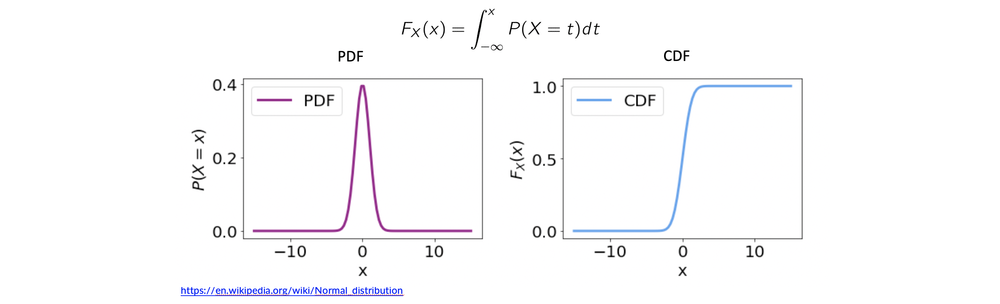

<font size=5><center>Each PDF has a CDF, which instead measures the probability that a random measure is __less than__ a particular value. They can be interconverted

***

### D. Distributions in Python

<font size=3>We can represent PDFs and CDFs in python using `scipy.stats`. __They have builtin distribution types__ (eg the function that defines the PDF is some mathematical function), but note that you can also define your own CDF and PDF.

<font size=3>Here I show the "normal" AKA "Gaussian" distribution

In [2]:
distr = scipy.stats.norm()

In [3]:
# ask for the value of PDF at a point
# returns the probability density at that point
distr.pdf(0)

0.3989422804014327

In [4]:
# ask for the value of CDF at a point
# returns the cummulative probability at that point
distr.cdf(0)

0.5

<font size=3>Notice that the CDF is 0.5 at 0 - __we expect this distribution then to have half its PDF area to the left__, and the other half to the right.

Text(0, 0.5, 'PDF')

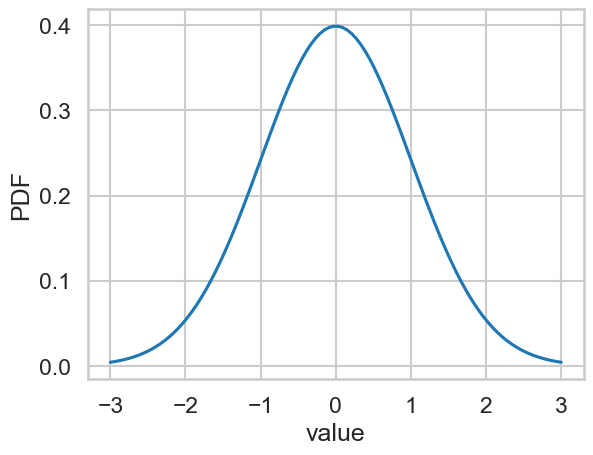

In [5]:
fig, ax = plt.subplots()
x = np.linspace(-3, 3, num=100)
sns.lineplot(x=x, y=distr.pdf(x), ax=ax)
ax.set_xlabel('value')
ax.set_ylabel('PDF')

Text(0, 0.5, 'CDF')

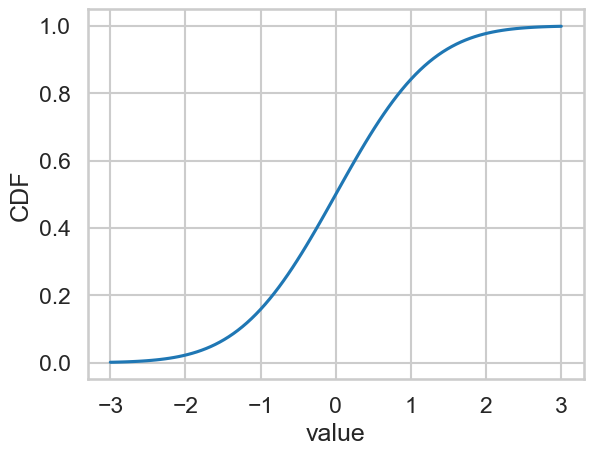

In [6]:
fig, ax = plt.subplots()
x = np.linspace(-3, 3, num=100)
sns.lineplot(x=x, y=distr.cdf(x), ax=ax)
ax.set_xlabel('value')
ax.set_ylabel('CDF')

<font size=3>We can also __take samples__ from this distrubution

In [7]:
# "rvs" means random variates
sample = distr.rvs(size=(30))

Text(0, 0.5, 'Counts in sample')

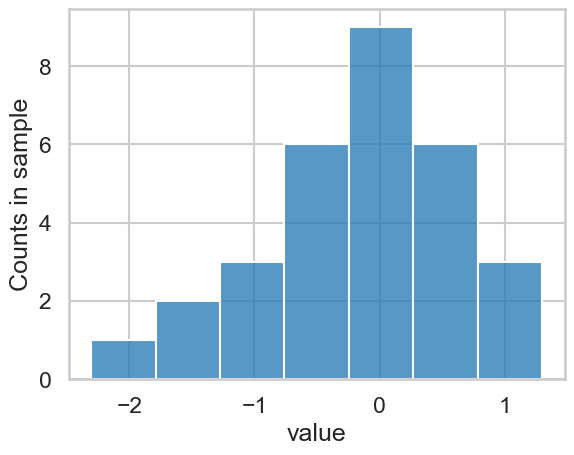

In [8]:
fig, ax = plt.subplots()
x = np.linspace(-3, 3, num=100)
sns.histplot(x=sample, ax=ax)
ax.set_xlabel('value')
ax.set_ylabel('Counts in sample')

<font size=4><center>__Notice how this histogram is not the same shape as the PDF...?__

<font size=4>This process is random! Any randome process usually has a way to fix the "randomness" using a parameter like `seed` or `random_state`

In [9]:
sample1 = distr.rvs(size=(30))
sample2 = distr.rvs(size=(30))

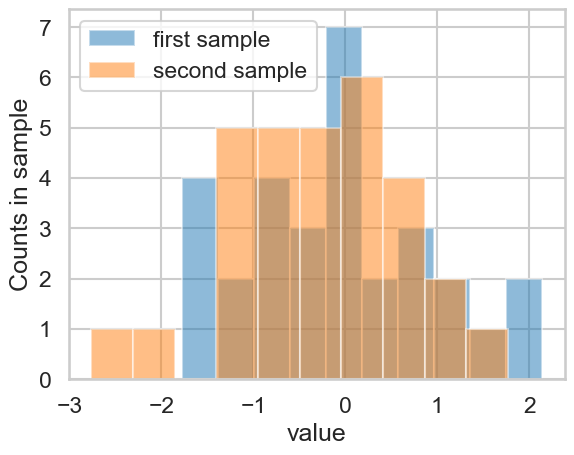

In [10]:
fig, ax = plt.subplots()
x = np.linspace(-3, 3, num=100)
ax.hist(x=sample1, label='first sample', alpha=.5)
ax.hist(x=sample2, label='second sample', alpha=.5)
ax.set_xlabel('value')
ax.set_ylabel('Counts in sample')
plt.legend()

In [11]:
sample1 = distr.rvs(size=(30), random_state=777)
sample2 = distr.rvs(size=(30), random_state=777)

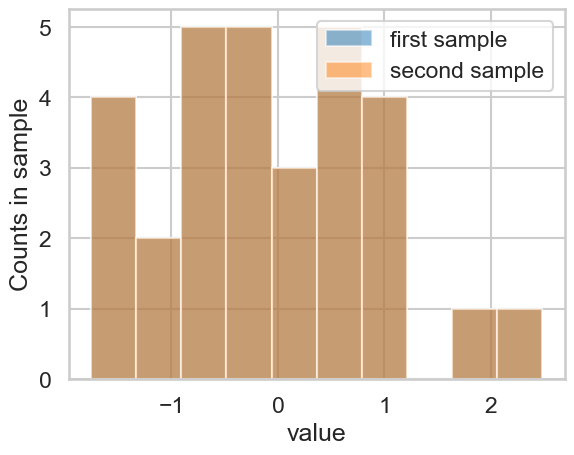

In [12]:
fig, ax = plt.subplots()
x = np.linspace(-3, 3, num=100)
ax.hist(x=sample1, label='first sample', alpha=.5)
ax.hist(x=sample2, label='second sample', alpha=.5)
ax.set_xlabel('value')
ax.set_ylabel('Counts in sample')
plt.legend()

## 2. Distribution Zoo

<font size=4><center>__Each of the following distributions has an analytical function__ fully characterized by some number of parameters. __Those expressions are not important__ for the context of this class, except for the first distribution.

#### Normal/Gaussian Distribution

<font size=3>Fully characterized by two parameters: $\mu$ and $\sigma$. __We like to assume a lot of things are Gaussian__ in order to draw conclusions (more later!) which is not always a good choice

$$pdf(x)=\frac{1}{\sigma\sqrt{2\pi}}e^{-0.5\frac{x-\mu}{\sigma}}$$

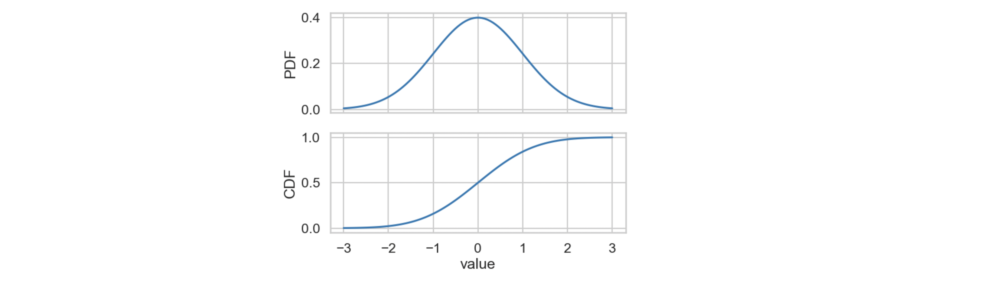

<font size=3>__The mean and the standard deviation of this distribution are exactly $\mu$ and $\sigma$!__

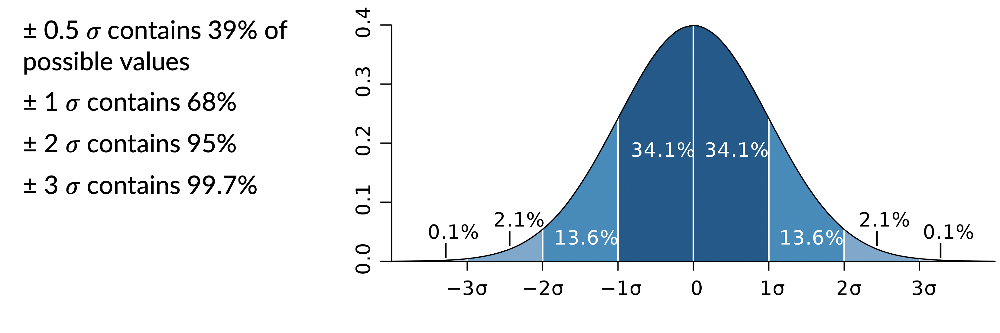

<font size=3><center>__Important special about normal distributions__: there is a symmetric specific probability of being a certain distance from the mean.

#### Uniform distribution

<font size=3>Defines a constant probability density within some bounds.

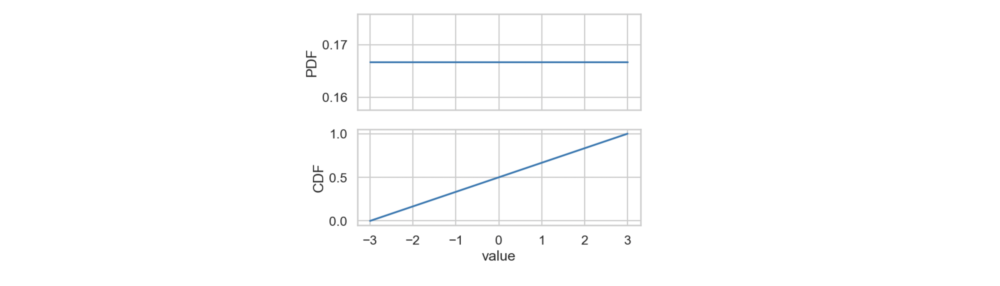

<font size=3><center>What is the mean, median, and mode?

#### Beta distribution

<font size=3>Fully characterized by __four__ parameters. The shape of this distribution is quite tunable, but it is used frequently to model distributions with bounded measurements. Below, $pdf(x)=0$ for $x<0$ and $x>1$

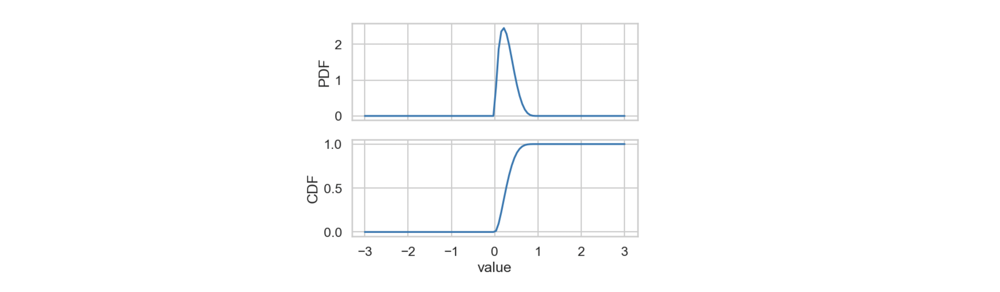

#### Bernoulli distribution

<font size=3>Describes a __discrete__ random variable with two possible values, eg. The samples can only take specific values. Here those values are 0 or 1. For discrete random variables, the probability of a particular value is called its __probability mass__ instead of probability density.

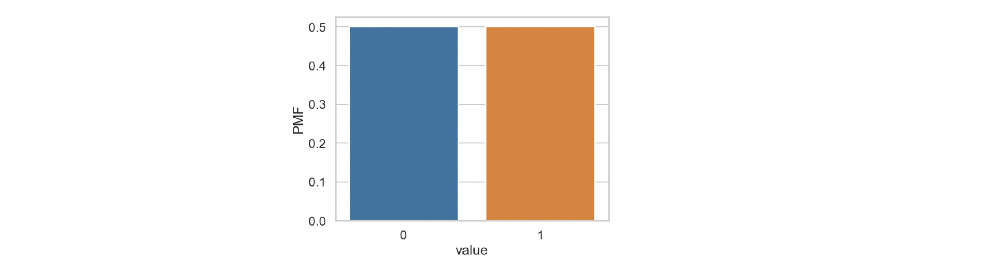

#### Poisson distribution
<font size=3>Discrete random variable often seen in physics. Can be used to describe number of events that will occur after a time.

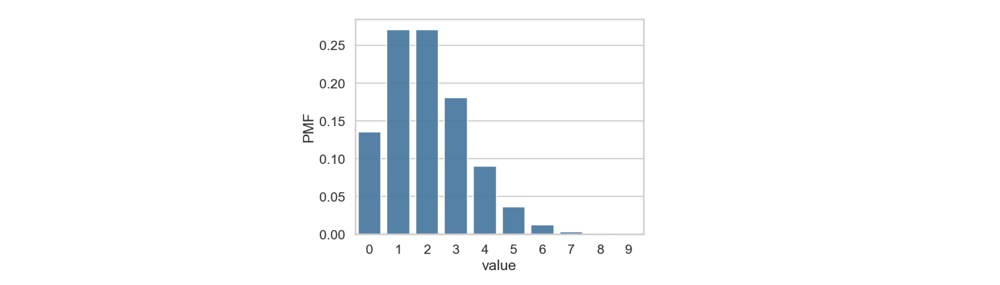

<font size=4><center>The purpose of showing you these distributions is __not to incite you to memorize__ them, it is just an act of exposure. __What are the different populations that we might observe out in the real world__?
    
***

## 3. Empirical distributions: when you don't know the PDF

<font size=4><center>Recall that __we usually do not have the population distribution__, only a sample from it. For the next few minutes we will work with __a sample from the Normal distribution__ with mean $2$ and standard deviation $1$.
    

In [13]:
x = np.linspace(-3, 6, 300)
distr = scipy.stats.norm(loc=2, scale=1)
pdf = distr.pdf(x)

In [14]:
# take a sample
sample = distr.rvs(100)

<font size=3><center>A histogram of our sample is the empirical counts of our sample, __a way to interpret the the empirical distribution__.

<AxesSubplot: ylabel='Count'>

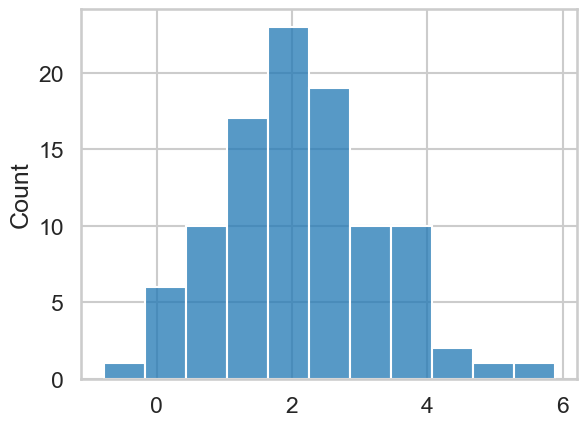

In [15]:
sns.histplot(sample)

<font size=4><center>__For the sake of argument, let's naively assume that the empirical distribution perfectly represents the population__.

<font size=3>We can quickly compute some statistics of our sample:

In [16]:
sample.mean()

2.102474914015168

In [17]:
sample.std()

1.1505299476500543

<font size=3>The mean and standard deivation of the __sample are not the same as the true distribution__

<font size=3><center>This is already enough to see that our assumption is incorrect, but let's press on. Our histogram has discrete counts, while a PDF has continuous probability densities. __We can create an empirical PDF from a histogram.__

#### Scipy let's us create PDFs from histograms.

What this actually does is creates an empirical CDF from the data, and interpolates and differentiates it. For more info [here](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.rv_histogram.html)

In [18]:
hist_data = np.histogram(sample)
empirical_distr = scipy.stats.rv_histogram(hist_data) # create the scipy distribution

In [19]:
# evaluate the PDF of this distribution at the same points we
# evaluated the true PDF
empirical_pdf = empirical_distr.pdf(x) 

#### We can also use a kernel density estimate

This method estimates a continuous function from data samples by adding up many small functions until it matches the data

In [20]:
kde_distr = scipy.stats.gaussian_kde(sample)

In [21]:
kde_pdf = kde_distr(x)

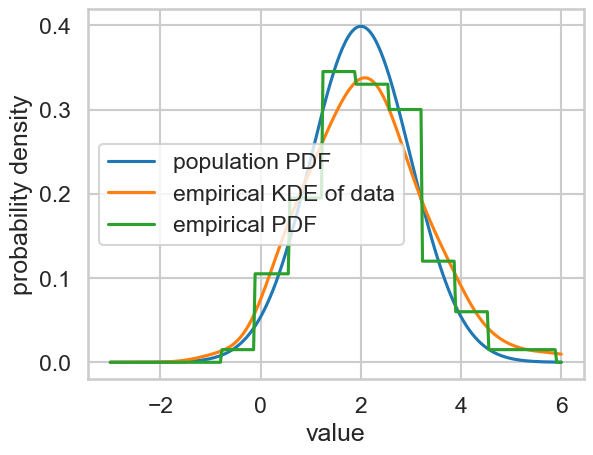

In [22]:
fig, ax = plt.subplots()
ax.plot(x, pdf, label='population PDF')
ax.plot(x, kde_pdf, label='empirical KDE of data')
ax.plot(x, empirical_pdf, label='empirical PDF')
ax.set_xlabel('value')
ax.set_ylabel('probability density')
plt.legend()

<font size=3>Let's quantify this difference as the average difference between the functions

In [23]:
def pdf_difference(true_pdf_vector, estimated_pdf_vector):
    """Determines the mean absolute difference between true and estimated functions evaluated on a vector."""
    return np.abs(true_pdf_vector-estimated_pdf_vector).mean()

In [24]:
print("The difference of the KDE is: ", pdf_difference(pdf, kde_pdf))
print("The difference of the empirical PDF is: ", pdf_difference(pdf, empirical_pdf))

The difference of the KDE is:  0.020237736654251534
The difference of the empirical PDF is:  0.021171589867164525


<font size=3><center>Again, we can see that __while the sample is close to the true distribution, it is not the same as the population__.

### B. _Exercise_: how does the empirical distribution change with size

<font size=3>Use the function `pdf_difference` above as well as one of the methods for getting the empirical PDF (histogram or KDE) to plot the difference between true and sample PDFs as a function of sample size.

In [25]:
# define sample sizes to try

# loop through sample sizes
#.   take a sample
#.   determine empirical pdf
#.   measure and record difference in pdf

# make plot

><span style='color:red'>remove for lecture</span>

In [26]:
sample_sizes = [5, 10, 20, 40, 80, 160, 320, 640]

absolute_errors = []
for size in sample_sizes:
    samp = distr.rvs(size)
    
    # get empirical pdf
    hist_data = np.histogram(samp)
    empirical_distr = scipy.stats.rv_histogram(hist_data)
    empirical_pdf = empirical_distr.pdf(x)
    
    # measure error
    absolute_errors.append(pdf_difference(pdf, empirical_pdf))

Text(0, 0.5, 'Empirical mean absolute error')

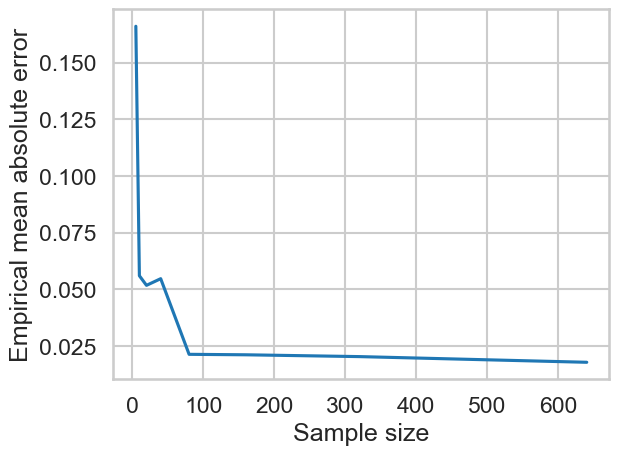

In [27]:
fig, ax = plt.subplots()
ax.plot(sample_sizes, absolute_errors)
ax.set_xlabel('Sample size')
ax.set_ylabel('Empirical mean absolute error')

<font size=5><center>__The larger the sample size, the more representative our sample is of the population!__

## 4. Population from Samples

<font size=4><center>If you know the whole PDF of a variable, __you have access to all statistical knowledge of that variable__! <span style="color:blue">Unfortunately you rarely have a PDF</span>.

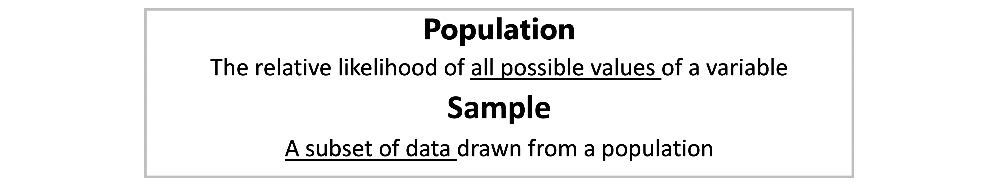

<font size=4><center>Our __goal is to use the sample to draw conclusions about the population__. From above, we can see that the sample is more representative of the population as it gets bigger, but __can we quantify the error of the sample without knowing the population__ somehow?
    
***

### A. _Exercise_: standard error of the mean

<font size=3> For a sample size of 100, __take 10000 samples__ and for each compute the mean. Then, __plot the histogram (empirical distribution) of the means__. _What do you notice about the result?_ __Repeat this for sample size 1000__, how do the results differ?

><span style='color:red'>remove for lecture</span>

(1.0, 3.0)

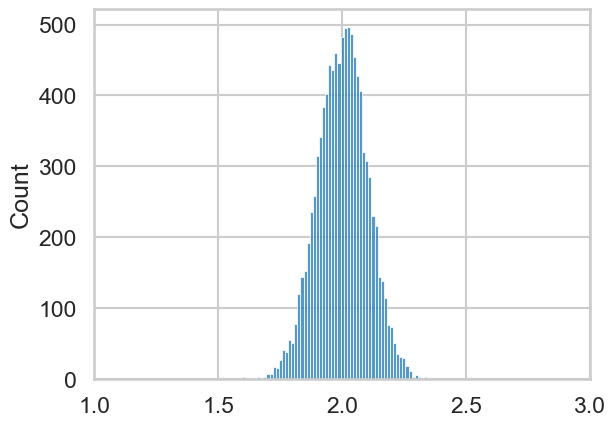

In [28]:
means = []

for i in range(10000):
    sample = distr.rvs(100)
    means.append(sample.mean())

fig, ax = plt.subplots()
sns.histplot(means, ax=ax)
ax.set_xlim(1, 3)

(1.0, 3.0)

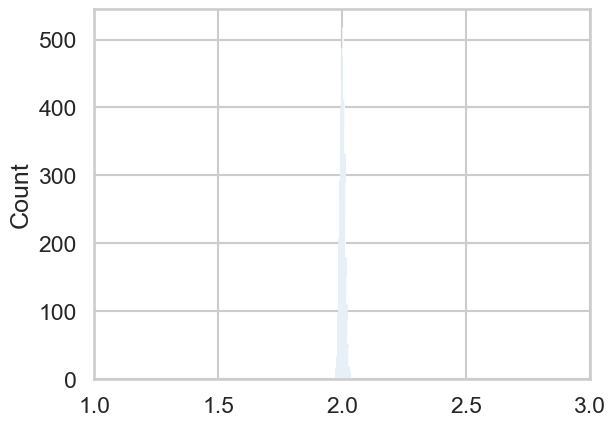

In [29]:
means = []

for i in range(10000):
    sample = distr.rvs(10000)
    means.append(sample.mean())

fig, ax = plt.subplots()
sns.histplot(means, ax=ax)
ax.set_xlim(1, 3)

<font size=4>__Observation 1__: The distribution of means resembles a Normal distribution

<font size=4>__Observation 2__: The width of the distribution of means gets tighter as the sample size gets larger.

***
<font size=5><center>__Recall the following about the Normal distribution__:

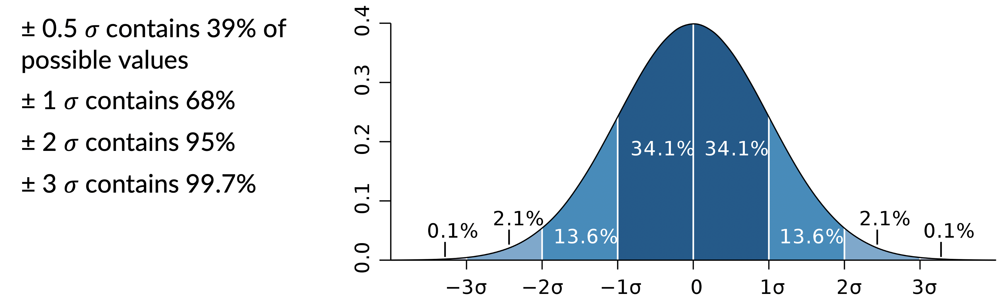

<font size=4><center>Given our observations, we can conclude that __we can measure the probability of the population mean being within a window__ by taking samples, and __we can tighten that window by taking large samples__.

***

### B. Estimating population statistics: Central limit theorem

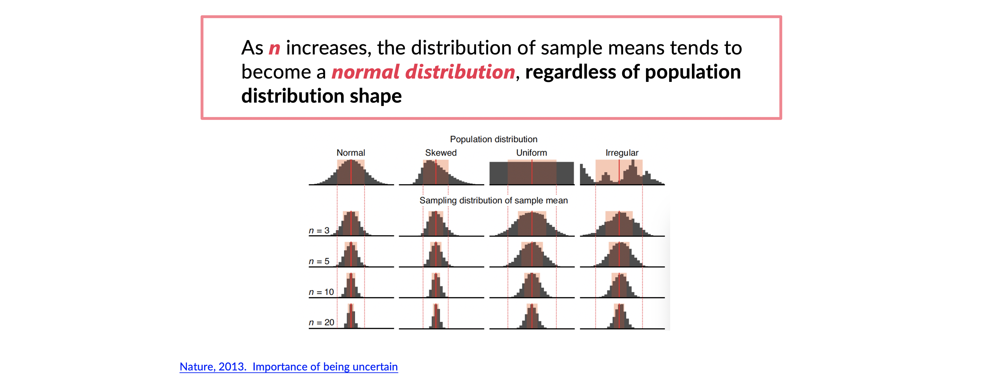

<font size=4><center>This tightening of the distribution of means is represented by a quantity called the __Standard Error__ (of the means):

$$SE=\sigma_\bar{\mu} = \frac{\sigma}{\sqrt{n}}\approx\frac{\sigma_X}{\sqrt{n}}$$

<font size=3>The approximation comes from the fact that we rarely know the population standard deviation ($\sigma$) and we instead estimate it using the sample standard deviation ($\sigma_X$).

In [30]:
n = 1000
sample = distr.rvs(n, random_state=777)

In [31]:
sample_mean = sample.mean()
standard_error = sample.std()/np.sqrt(n)

print(f'Sample mean: {sample_mean}, standard error: {standard_error}')

Sample mean: 2.032170464804657, standard error: 0.031734370816934684


<font size=4><center>__Thus, if we take a sample of size $n$ and std $\sigma_X$, we have an indication that we can be confident that the population mean $\mu$ is within $\sigma_\bar{\mu}$ of the sample mean $\bar{\mu}$__. Specifically, in this case, we are 95% confident that the true mean is within 0.06 of 2.03, and indead it is.

<font size=4><center>__NOTE__ that "there is a 95% chance that the true mean is within the interval" is an __incorrect__ interpretation. The true mean is a fixed number. Instead we are 95% confident that we have captured the true mean within the interval.

### C. Confidence interval of the mean with t statistic
<font size=4><center> We need to make a slight modification to the above. __The conceptual understanding should not change__. __Given the central limit theorem, if the sample size is small, the distribution of means isn't very Gaussian__. Because of this we use the "T" distribution to determine the confidence instead of the Normal distribution.

<font size=3> We can quickly calculate a confidence interval using one of these "t tests" in python

In [32]:
scipy.stats.t.interval(alpha=0.95, df=len(sample)-1, loc=sample_mean, scale=standard_error) 

(1.9698967932076026, 2.094444136401711)

<font size=3> Here, `alpha` is how confident we want to be, and `df` is degrees of freedom, which is the sample size minus one. __Thus, we are confident the mean is between 1.97 and 2.09__.

### D. _Exercise_: Estimate the population mean of HCEPDB data
<font size=3>For photovoltaics we care a lot about the difference between LUMO and HOMO energy. Estimate the population mean of this value.


In [33]:
df = pd.read_csv('http://faculty.washington.edu/dacb/HCEPDB_moldata.zip')
data = df['e_lumo_alpha'] - df['e_homo_alpha']

<font size=4><center>The empirical distribution of energy gaps in the HCEPDB dataset

<AxesSubplot: ylabel='Count'>

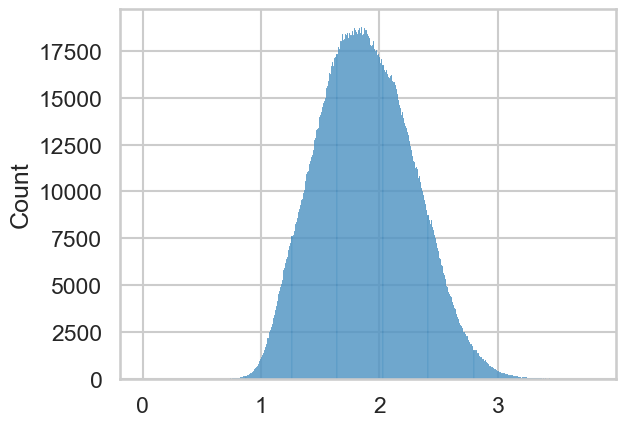

In [34]:
sns.histplot(data)

In [35]:
se = data.std()/len(data)
mu_s = data.mean()

In [36]:
print(f"We are 95% sure that the mean of LUMO - HOMO is within: \
  {scipy.stats.t.interval(alpha=0.95, df=len(data)-1, loc=mu_s, scale=se)}")

We are 95% sure that the mean of LUMO - HOMO is within:   (1.8812128888190114, 1.8812135643134598)


<font size=3>We are quite confident because n is so large!

## Summary


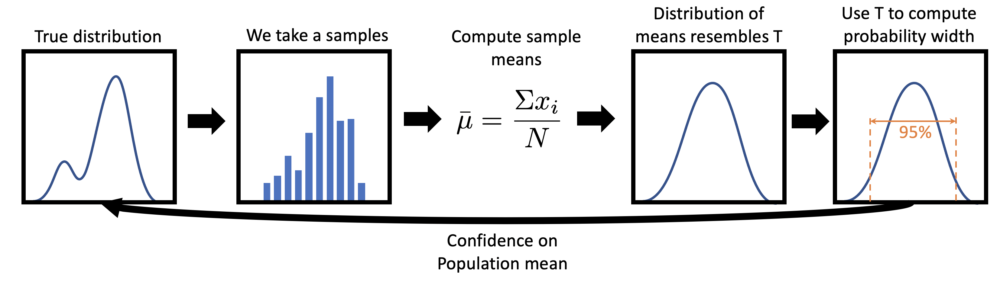<font size=4> -We explored how __liklihood of the value of a variable__ can be represented by its PDF and SDF, and some __basic statistics__

<font size=4> -__We saw a number of different distribution functions__ we could see, for continuous and discrete variables
    
<font size=4> -We explored the (most common) situation where we do not know the "population" distribution and instead have a "sample" for which we can __create empirical distributions__
    
<font size=4> -We showed that given the central limit theorem, __we can estimate the population mean from just a sample of data__, within some confidence 